In [15]:
%reload_ext autoreload
%autoreload 2

In [16]:
import os
from datetime import datetime, timedelta
from glob import glob
from itertools import repeat
from multiprocessing.pool import ThreadPool
from types import SimpleNamespace

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import xarray
from cartopy.mpl.gridliner import (
    LatitudeFormatter,
    LatitudeLocator,
    LongitudeFormatter,
    LongitudeLocator,
)
from dataset.dataset import ForecastingDataset2,  pickle_read, pickle_write
from dataset.normalization import ZeroMinMax
from dataset.station_dataset import GroundstationDataset
from lightning.pytorch import Trainer
from lightning.pytorch.loggers import WandbLogger
from models.LightningModule import LitEstimatorPoint
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from utils.plotting import plot_station_scatter, prediction_error_plot

plt.rcParams["text.usetex"] = False


In [17]:
config = {
    "batch_size": 10000,
    "patch_size": {
        "x": 15,
        "y": 15,
        "stride_x": 1,
        "stride_y": 1,
    },
    "x_vars": [
        "channel_1",
        "channel_2",
        "channel_3",
        "channel_4",
        "channel_5",
        "channel_6",
        "channel_7",
        "channel_8",
        "channel_9",
        "channel_10",
        "channel_11",
        "DEM",
    ],
    "y_vars": ["SIS"],
    "x_features": [
        "dayofyear",
        "lat",
        "lon",
        "SZA",
        "AZI",
    ],  # 'sat_SZA', 'sat_AZI', 'coscatter_angle'],
    "transform": ZeroMinMax(),
    "target_transform": ZeroMinMax(),
}
config = SimpleNamespace(**config)

In [18]:
# estimator = LitEstimator()
trainer = Trainer(
    accelerator="gpu",
    devices=1,
    precision="32",
)


# Emulator
# chkpt_fn = '/scratch/snx3000/kschuurm/irradiance_estimation/train/SIS_point_estimation/jup3gn3n/checkpoints/epoch=1-val_loss=0.00705.ckpt'

# finetuned on DWD
# chkpt_fn = '/scratch/snx3000/kschuurm/irradiance_estimation/train/SIS_point_estimation_groundstation/hmobjerd/checkpoints/epoch=1-bsrnval_loss/dataloader_idx_1=0.01771-dwdval_loss/dataloader_idx_0=0.01761.ckpt'
# DWD -> METEOSWISS
# chkpt_fn = '/scratch/snx3000/kschuurm/irradiance_estimation/train/SIS_point_estimation_groundstation/4j9y9tqb/checkpoints/epoch=3-bsrnval_loss/dataloader_idx_1=0.01907-dwdval_loss/dataloader_idx_0=0.01901.ckpt'
# DWD -> meteoswiss -> bsrn
chkpt_fn = "/scratch/snx3000/kschuurm/irradiance_estimation/train/SIS_point_estimation_groundstation/hg90jzjy/checkpoints/epoch=1-bsrnval_loss/dataloader_idx_1=0.01735-dwdval_loss/dataloader_idx_0=0.01794-meteoval_loss/dataloader_idx_2=0.02489.ckpt"


# groundstations only
# chkpt_fn = '/scratch/snx3000/kschuurm/irradiance_estimation/train/SIS_point_estimation_groundstation/6zy2qu70/checkpoints/last.ckpt'


inference_fn = chkpt_fn.split("checkpoints")[0] + "inference/"
if not os.path.exists(inference_fn):
    os.mkdir(inference_fn)
    os.mkdir(inference_fn + "IEA_PVPS/")
    os.mkdir(inference_fn + "METEOSWISS/")
    os.mkdir(inference_fn + "DWD_valid/")
    os.mkdir(inference_fn + "DWD_train/")
    os.mkdir(inference_fn + "KNMI/")

if not os.path.exists(inference_fn + "DWD_valid/"):
    os.mkdir(inference_fn + "DWD_valid/")
    os.mkdir(inference_fn + "DWD_train/")

estimator = LitEstimatorPoint.load_from_checkpoint(
    chkpt_fn,
    learning_rate=0.001,
    config=config,
)
print(chkpt_fn)
model_nm = inference_fn.split('/inference')[0].split('/')[-1]

/scratch/snx3000/kschuurm/lightning-env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /scratch/snx3000/kschuurm/lightning-env/lib/python3. ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


/scratch/snx3000/kschuurm/irradiance_estimation/train/SIS_point_estimation_groundstation/hg90jzjy/checkpoints/epoch=1-bsrnval_loss/dataloader_idx_1=0.01735-dwdval_loss/dataloader_idx_0=0.01794-meteoval_loss/dataloader_idx_2=0.02489.ckpt


/scratch/snx3000/kschuurm/lightning-env/lib/python3.9/site-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'metric' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['metric'])`.


In [19]:
from dataset.dataset import ImageDataset

estimator.eval()

dataset = ImageDataset(
    y_vars=config.y_vars,
    x_vars=config.x_vars,
    x_features=config.x_features,
    patch_size=config.patch_size,
    transform=config.transform,
    target_transform=config.target_transform,
    subset_time=slice("2023-07-01T00", "2023-07-31T23"),
)

W = dataset.W - dataset.pad * 2
H = dataset.H - dataset.pad * 2

predict_dataloader = DataLoader(
    dataset,
    batch_size=None,
    shuffle=False,
    num_workers=0,
)

for i, batch in enumerate(tqdm(predict_dataloader)):
    if i > 0:
        break

17358 20330
['IR_016' 'IR_039' 'IR_087' 'IR_097' 'IR_108' 'IR_120' 'IR_134' 'VIS006'
 'VIS008' 'WV_062' 'WV_073']
['channel_3' 'channel_4' 'channel_7' 'channel_8' 'channel_9' 'channel_10'
 'channel_11' 'channel_1' 'channel_2' 'channel_5' 'channel_6']


  0%|          | 1/2975 [00:02<1:56:16,  2.35s/it]


In [22]:
predict_dataloader = DataLoader(
    dataset,
    batch_size=None,
    shuffle=False,
    num_workers=10,
)

SIS_pred = torch.zeros((len(dataset.seviri.time), dataset.scan_W*dataset.scan_H))

for batch_idx, batch in tqdm(
    enumerate(predict_dataloader), total=len(predict_dataloader)
):
    X, x, ghi_cls = batch
    sz = X.shape[0]
    div = 50
    step = int(np.ceil(sz/div))
    y_hat_ls = []
    for i in range(0, sz, step):
        X_, x_ = X[i:min(i+step, sz)], x[i:min(i+step, sz)]
        y_hat, _, _= estimator.predict_step((X_.cuda(), x_.cuda(), 0))
        y_hat = config.target_transform.inverse(y_hat, config.y_vars)
        y_hat = y_hat.cpu().detach()
        y_hat_ls.append(y_hat)

    SIS_pred[batch_idx] = torch.cat(y_hat_ls).squeeze()


100%|██████████| 2975/2975 [53:49<00:00,  1.09s/it]


In [23]:
testdataset = dataset.seviri.isel(
    lat=slice(dataset.pad, -dataset.pad), lon=slice(dataset.pad, -dataset.pad)
).drop_duplicates('time')

SIS_CLS = dataset.solarpos.data.sel(channel='SIS_CLS').isel(
    lat=slice(dataset.pad, -dataset.pad), lon=slice(dataset.pad, -dataset.pad)
)

SZA = dataset.solarpos.data.sel(channel='SZA').isel(
    lat=slice(dataset.pad, -dataset.pad), lon=slice(dataset.pad, -dataset.pad)
)

SIS_pred = SIS_pred.reshape(SIS_pred.shape[0], dataset.scan_H, dataset.scan_W)

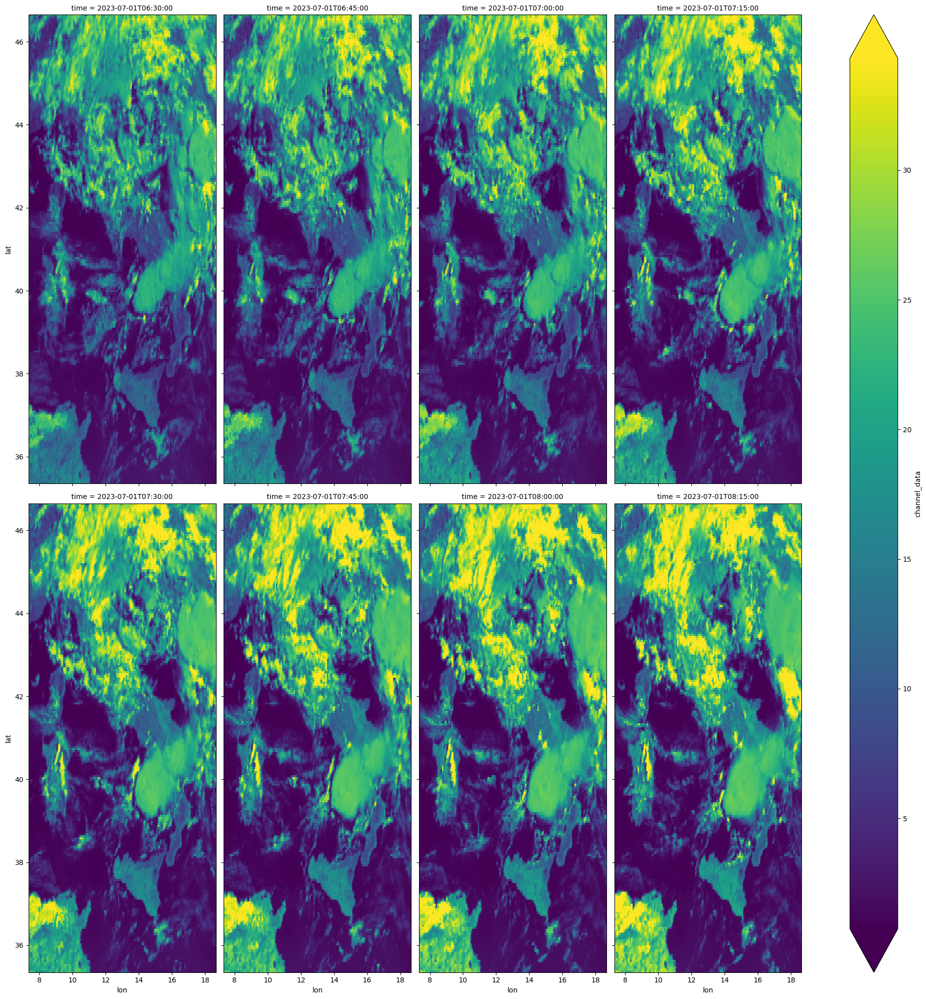

In [24]:
testdataset.channel_data.sel(channel='channel_3').isel(time=slice(26,34)).plot.imshow(
    x="lon",
    y="lat",
    col="time",
    col_wrap=4,
    cmap="viridis",
    robust=True,
    figsize=(20, 20),
)


In [25]:
output = xarray.Dataset(
    {
        "SIS": (("time", "lat", "lon"), SIS_pred),
        "SIS_CLS": (("time", "lat", "lon"), SIS_CLS.data),
        "SZA": (("time", "lat", "lon"), SZA.data)
    },
    coords={
        "time": dataset.seviri.time,
        "lat": dataset.seviri.lat.isel(lat=slice(dataset.pad, -dataset.pad)),
        "lon": dataset.seviri.lon.isel(lon=slice(dataset.pad, -dataset.pad)),
    },
).drop_duplicates('time')
output["CSI"] = xarray.where(output.SZA < 85/180*np.pi, output.SIS / output.SIS_CLS, np.nan)


In [20]:
output_sub = output.isel(time=slice(40, 48))

/scratch/snx3000/kschuurm/lightning-env/lib/python3.9/site-packages/dask/core.py:127: divide by zero encountered in divide
/scratch/snx3000/kschuurm/lightning-env/lib/python3.9/site-packages/dask/core.py:127: invalid value encountered in divide


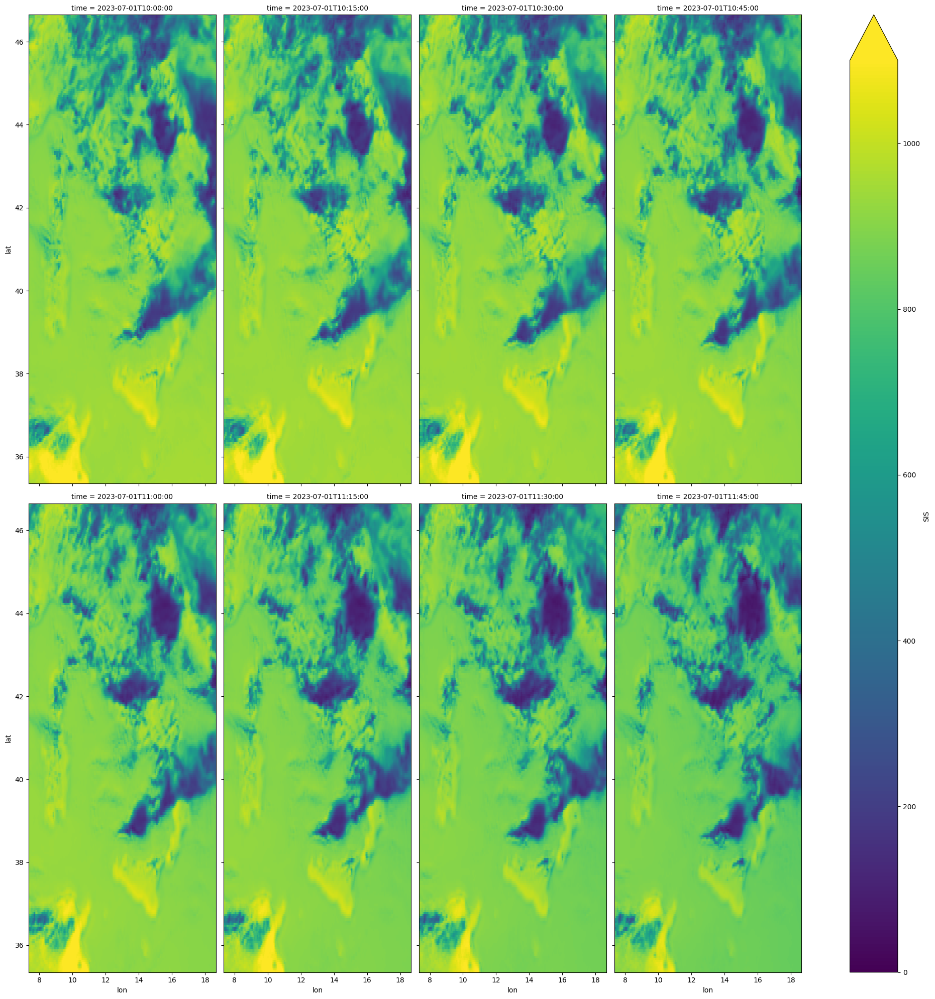

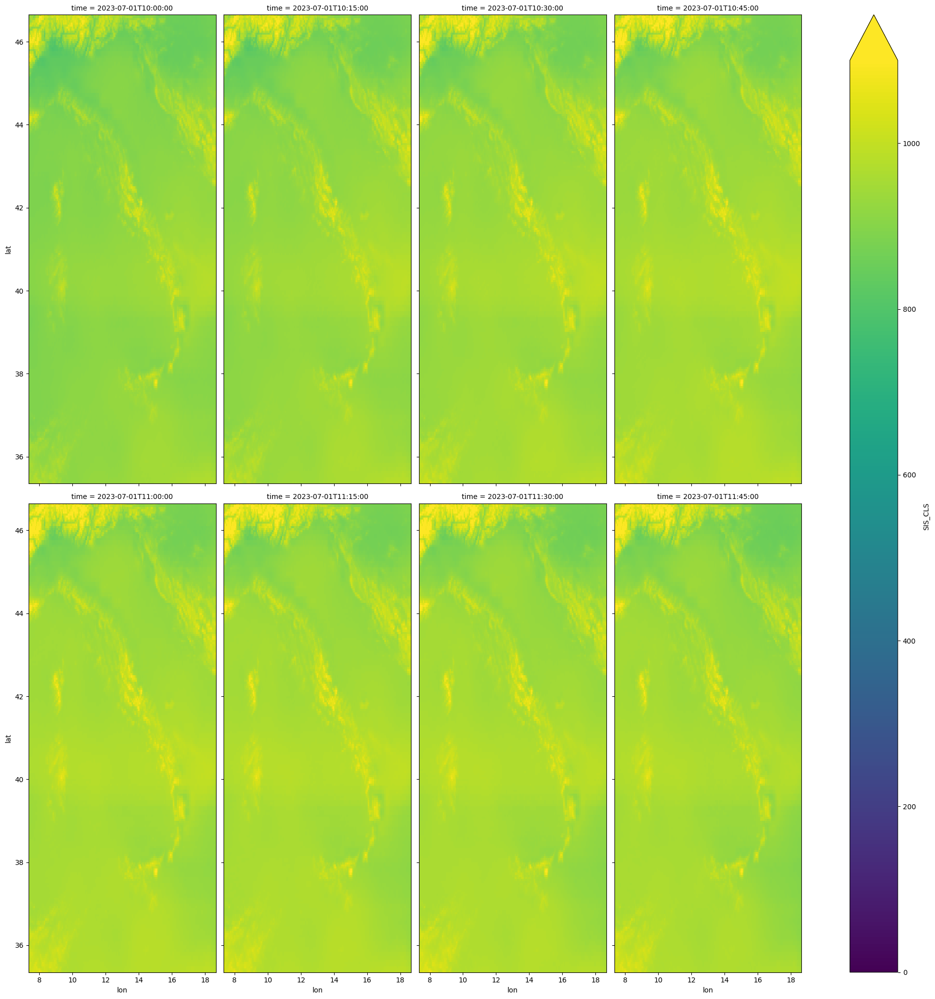

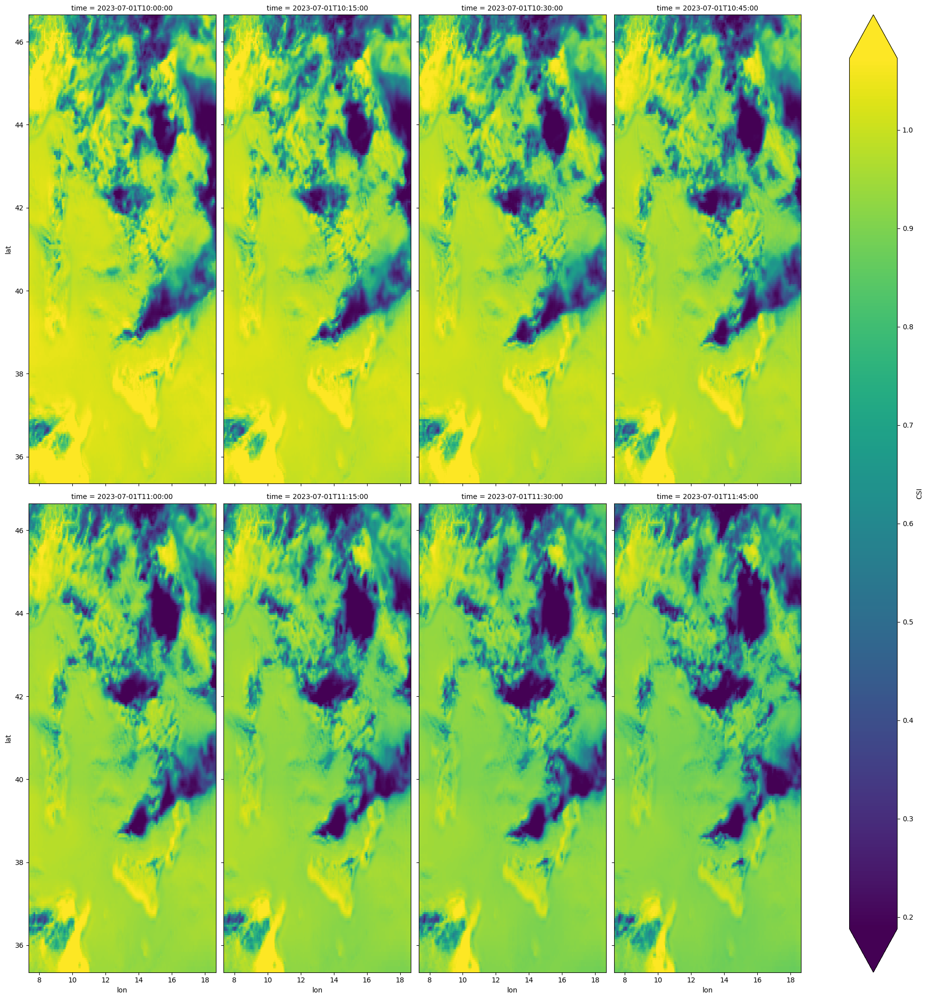

In [21]:
output_sub.SIS.plot.imshow(
    x="lon",
    y="lat",
    col="time",
    col_wrap=4,
    cmap="viridis",
    robust=True,
    figsize=(20, 20),
    vmin=0,
    vmax=1100,
)


output_sub.SIS_CLS.plot.imshow(
    x="lon",
    y="lat",
    col="time",
    col_wrap=4,
    cmap="viridis",
    robust=True,
    figsize=(20, 20),
        vmin=0,
    vmax=1100,
)

output_sub.CSI.plot.imshow(
    x="lon",
    y="lat",
    col="time",
    col_wrap=4,
    cmap="viridis",
    robust=True,
    figsize=(20, 20),
)



In [26]:

for var in output:
    output[var].encoding.clear()
    
for var in output.coords:
    output[var].encoding.clear()
    
output = output.chunk({'time':96, 'lat':-1, 'lon':-1})



In [27]:
output.to_zarr(f'{model_nm}_{str(dataset.subset_time.start)}_{str(dataset.subset_time.stop)}.zarr')

/scratch/snx3000/kschuurm/lightning-env/lib/python3.9/site-packages/dask/core.py:127: divide by zero encountered in divide
/scratch/snx3000/kschuurm/lightning-env/lib/python3.9/site-packages/dask/core.py:127: invalid value encountered in divide


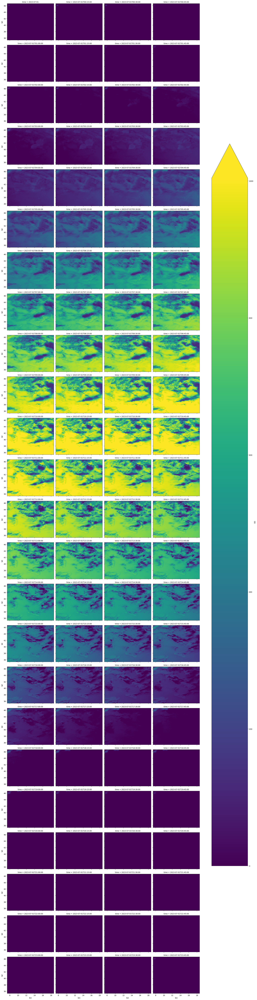

In [34]:
xarray.open_zarr('/scratch/snx3000/kschuurm/irradiance_estimation/inference/hmobjerd_2023-07-01T00_2023-07-31T23.zarr').isel(time=slice(0,96)).SIS.plot.imshow(
    x="lon",
    y="lat",
    col="time",
    col_wrap=4,
    cmap="viridis",
    robust=True,
    figsize=(20, 80),
)

# SOLARPOSITION and GHI cls calculation

In [ ]:
solarpos = xarray.open_zarr('/scratch/snx3000/kschuurm/ZARR/SOLARPOS_Italy.zarr')
solarpos

In [ ]:
zarrdataset = xarray.open_zarr(
    "/scratch/snx3000/kschuurm/ZARR/SEVIRI_FULLDISK_Italy.zarr"
)
zarrdataset = zarrdataset.sel(y=np.sort(list(set(zarrdataset.y.values).difference(set(solarpos.lat.values)))
                             ))
dem = xarray.open_zarr("/scratch/snx3000/kschuurm/ZARR/DEM.zarr").fillna(0).load()
dem = dem.sel(lat=zarrdataset.y, lon=zarrdataset.x)


zarrdataset

In [ ]:
from utils.clearsky import Clearsky, SolarPosition


def get_stuff(datetimes, lat, lon, altitude):

    solarposition = SolarPosition(datetimes, lat, lon, altitude).get_solarposition()

    clearsky = Clearsky(datetimes, lat, lon, altitude, solarposition=solarposition)
    ghi_cls = clearsky.get_clearsky()
    AZI = solarposition["apparent_azimuth"]
    SZA = solarposition["apparent_zenith"]

    return ghi_cls.astype(np.float16), AZI.astype(np.float16), SZA.astype(np.float16)


XX, YY = xarray.broadcast(zarrdataset.x, zarrdataset.y)

In [ ]:
YY.values.shape

In [ ]:
XX_input = XX.values.flatten()
YY_input = YY.values.flatten()
dem_input = dem.DEM.values.transpose().flatten()
datetimes = pd.to_datetime(zarrdataset.time.values)


In [ ]:
ghi, azi, sza = get_stuff(datetimes, YY_input[0], XX_input[0], dem_input[0])

In [ ]:
from functools import partial
from multiprocessing import Pool

partial_stuff = partial(get_stuff, datetimes)


with Pool(24) as pool:
    output = pool.starmap(
        partial_stuff,
        tqdm(zip(YY_input, XX_input, dem_input), total=len(dem_input), smoothing=0),
        chunksize=50,
    )

In [ ]:
ghis = [x[0].reshape(-1, 1) for x in output]
azis = [x[1].reshape(-1, 1) for x in output]
szas = [x[2].reshape(-1, 1) for x in output]

ghi = np.concatenate(ghis, axis=1).reshape(len(datetimes), *XX.shape)  # time lon lat
azi = np.concatenate(azis, axis=1).reshape(len(datetimes), *XX.shape)
sza = np.concatenate(szas, axis=1).reshape(len(datetimes), *XX.shape)

In [ ]:
output_xr = xarray.Dataset(
    {
        "SIS_CLS": (("time", "lat", "lon"), ghi.transpose(0, 2, 1)),
        "AZI": (("time", "lat", "lon"), azi.transpose(0, 2, 1)),
        "SZA": (("time", "lat", "lon"), sza.transpose(0, 2, 1)),
    },
    coords={
        "time": zarrdataset.time,
        "lat": zarrdataset.y.values,
        "lon": zarrdataset.x.values,
    },
).drop_duplicates("time")

In [ ]:
output_xr.sel(time="2023-7-01T12", method="nearest").SIS_CLS.plot.imshow(x='lon', y='lat')

In [ ]:
for var in output_xr:
    output_xr[var].encoding.clear()
    


In [ ]:
output_xr = output_xr.to_dataarray('channel', 'data')

output_xr = output_xr.chunk({'channel':-1, 'time':100, 'lat':-1, 'lon':-1})


In [ ]:
output_xr = output_xr.to_dataarray('channel', 'data').to_dataset()
output_xr